# Importing Packages

In [194]:
%matplotlib inline

import pandas as pd
import missingno as mno
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression

# Dataset analysis

### Reading CSV Dataset

In [195]:
df = pd.read_csv("../input/weather-dataset-rattle-package/weatherAUS.csv")

### Checking first 5 rows

In [196]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


## Checking shape of Dataframe

In [197]:
df.shape

(145460, 23)

# Variable Identification

## Checking Dataframe Info

In [198]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

There are 16 *float64* column (numerical) and 7 *object* column (categorical).



## Checking null value count for each column

In [199]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

There are lot of null values in each column, except for date and location.

## Visualizing Null values using missingno

<AxesSubplot:>

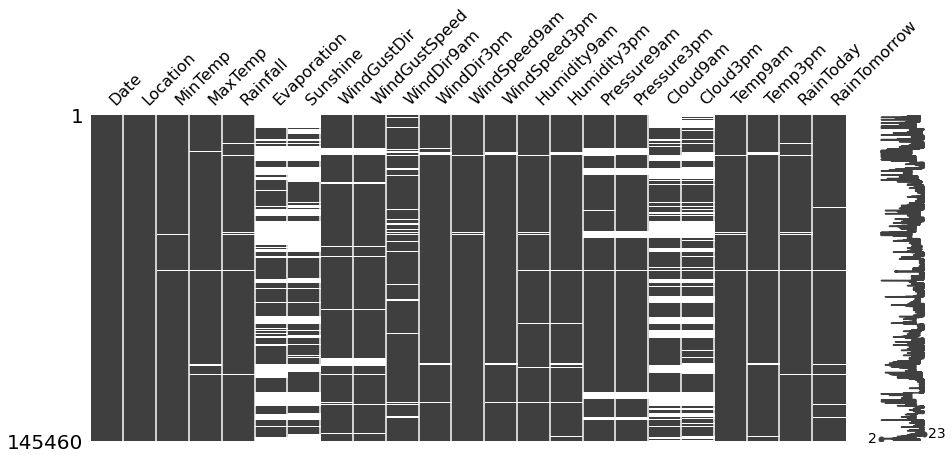

In [200]:
mno.matrix(df, figsize = (15, 6))

It can be visually seen that Evaporation, Sunshine, Cloud9am and Cloud3pm has lot of missing values.

# Data Preprocessing

## Filtering numerical and categorical columns

In [201]:
numerical_df_cols = df.columns[df.dtypes != object]

In [202]:
numerical_df_cols

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

In [203]:
categorical_df_cols = df.columns[df.dtypes == object]

In [204]:
categorical_df_cols

Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')

## Filetring Null value column dataframe

In [205]:
null_cols_df =  df[df.columns[df.isnull().any()]].copy()

In [206]:
null_cols_df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


## Data Preprocessing for Numberical Columns

### Checking if Central tendencies can be used for imputing missing values.

In [207]:
def draw_histplot_between_num_features():
    fig, axes = plt.subplots(4, len(numerical_df_cols) // 4, figsize=(50, 50))
    row_idx = 0
    col_idx = 0
    for col in numerical_df_cols:
        if col_idx > 1 and col_idx % 3 == 1:
            row_idx += 1
            col_idx = 0
        sns.histplot(x=col, data=df, ax = axes[row_idx, col_idx])
        col_idx += 1
    plt.show()

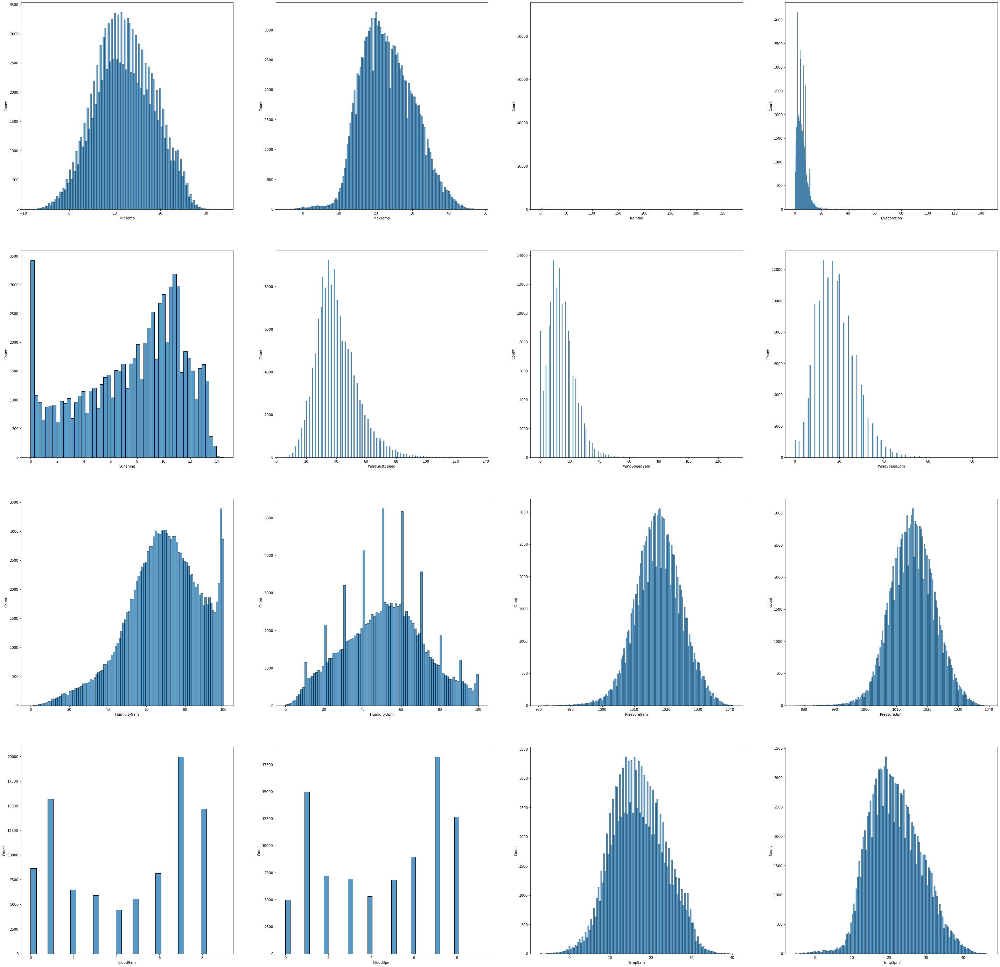

In [208]:
draw_histplot_between_num_features()

Though most of the features seems to follow normal distribution, we cannot use mean to impute missing value because outliers. We can verify outliers using Boxplot

### Boxplot to visualize outlier

In [209]:
def draw_boxplot_for_num_features():
    fig, axes = plt.subplots(4, len(numerical_df_cols) // 4, figsize=(50, 50))
    row_idx = 0
    col_idx = 0
    for col in numerical_df_cols:
        if col_idx > 1 and col_idx % 3 == 1:
            row_idx += 1
            col_idx = 0
        sns.boxplot(x=col, data=df, ax = axes[row_idx, col_idx])
        col_idx += 1
    plt.show()

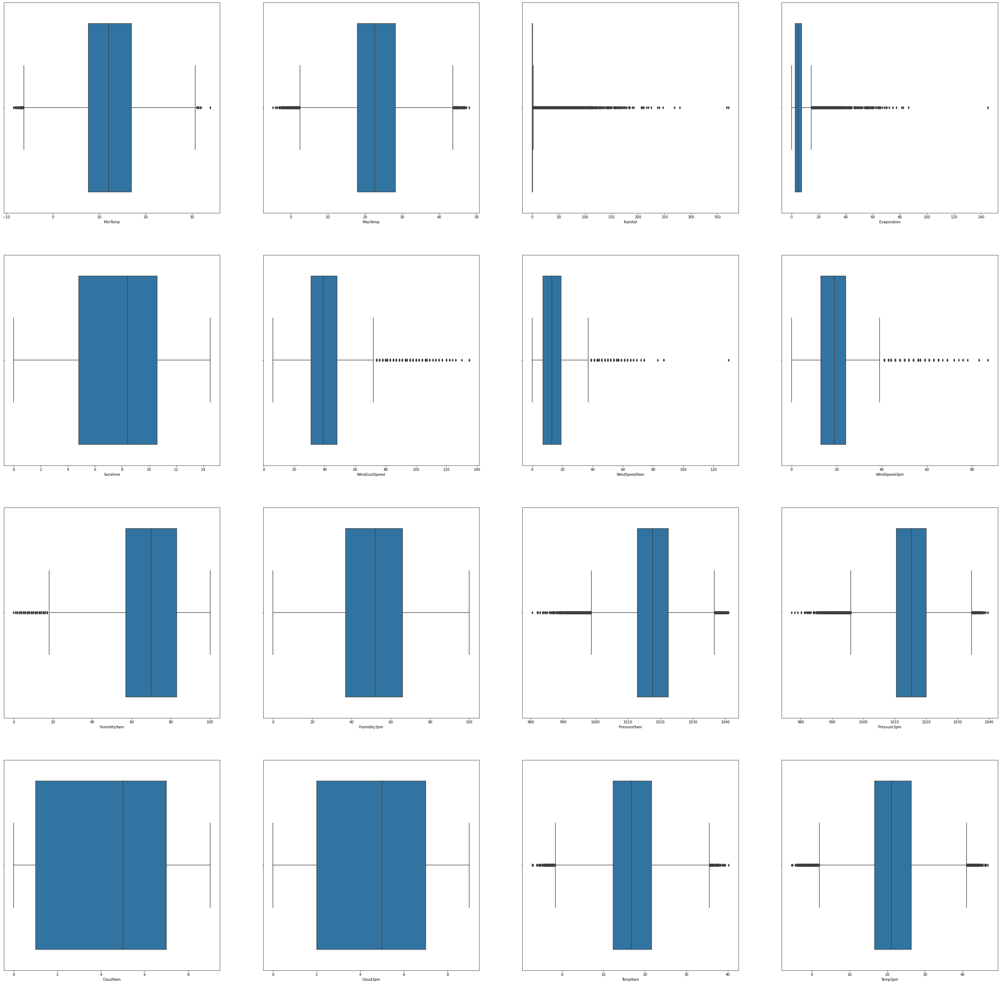

In [210]:
draw_boxplot_for_num_features()

It can be seen that most outliers are in **Rainfall** and **Evaporation**.

### Scatter plot between numerical features

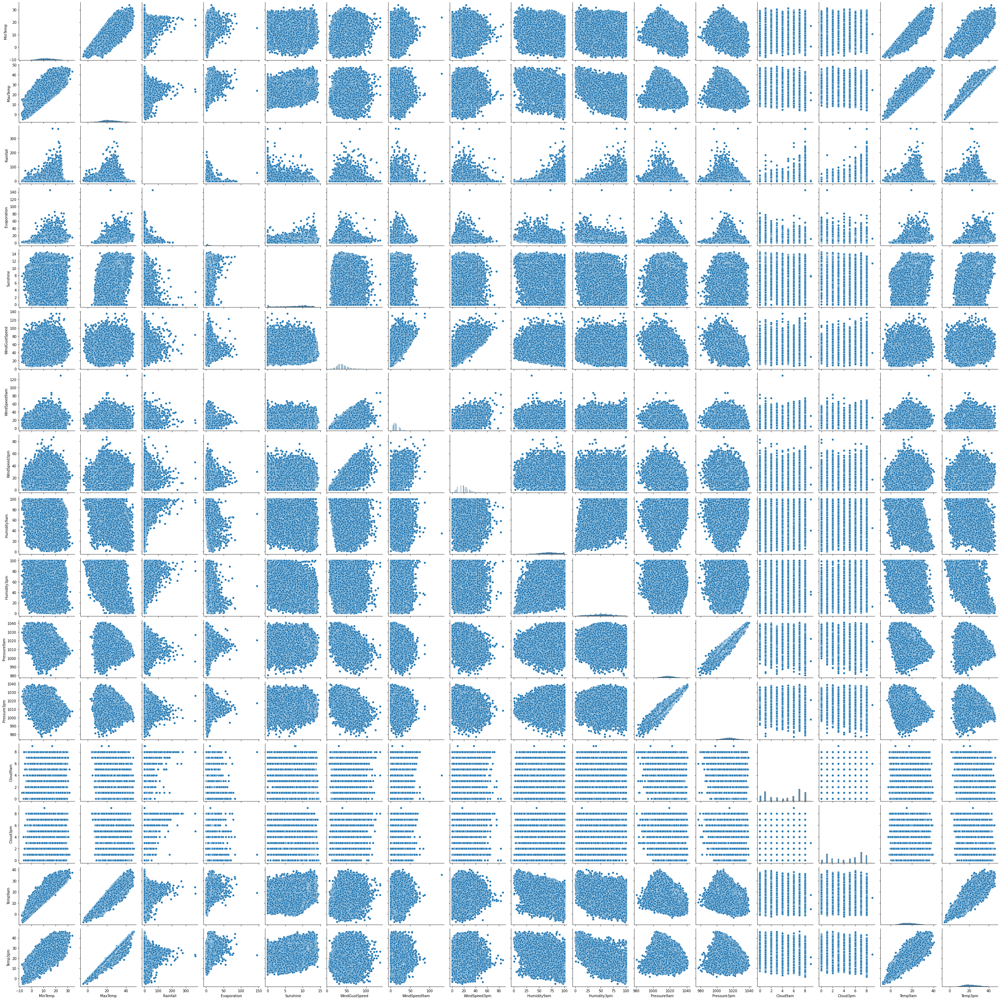

In [211]:
sns.pairplot(df[numerical_df_cols])

It can be seen that mostly all features all follow linear relationship with other features. So we can try using Linear Regression to impute missing value.

#### Numerical Null value columns

In [212]:
numberical_null_value_cols = null_cols_df.columns[null_cols_df.dtypes != object]

In [213]:
numberical_null_value_cols

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

## Regression to impute missing value

Our dataset has lot of missing value, even dependent variable will also have missing values, So we can't use them directly. 
* First we have to create a copy of all numberical missing column.
* Then we can fill some random values using Simple Random Imputation. *(Simple Random Imputation)* Check [this](#Filling-NaN-with-Simple-Random-Imputation) section.
* Then we will use the regression to fill the value in actual columns, one by one. *(Deterministic Regression Imputation)*. Check [this](#Applying-Deterministic-Regression-Imputation) section.

**Before using Regression, we have to find the higly correlated column for each feature. So that we use only higly correlated column to impute the values.**

### Simple Random Imputation

It is used to fill missing values in dependent variable,so that we can use regression models. We will suffix the column with *'_imp'*

In [214]:
def simple_random_imputation(df):
    dataset = df.copy()
    for feature in numberical_null_value_cols:
        dataset[feature] = dataset[feature]
        number_missing = dataset[feature].isnull().sum()
        observed_values = dataset.loc[dataset[feature].notnull(), feature]
        dataset.loc[df[feature].isnull(), feature] = np.random.choice(observed_values, number_missing, replace = True)
            
    return dataset
       

### Deterministic Regression Imputation

It is used to replace the missing value with exact regression output without considering the error term. It may result in overfitting because error term is not considered. **We will prefix the column with 'det_' imputed with this regression**. Later in this notebook we will implement stochastic regression imputation that will overcome the issue of Deterministic Regression Imputation.

In [215]:
def deterministic_regression_imputation(df, feature, correlated_cols):
    dataset = df.copy()
    dataset["det_" + feature] = df_imp[feature]
    parameters = list(correlated_cols) 

    #linear Regression model to estimate the missing data
    model = LinearRegression()
    model.fit(X = df_imp[parameters], y = df_imp[feature])
    dataset.loc[dataset[feature].isnull(), "det_" + feature] = model.predict(df_imp[parameters])[dataset[feature].isnull()]
    
    dataset[feature] = dataset["det_" + feature]
    dataset.drop("det_" + feature, axis = 1, inplace = True)
    return dataset

        

#### Filling NaN with Simple Random Imputation

In [216]:
df_imp = simple_random_imputation(df)

#### Checking newly added Columns

In [217]:
df_imp.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [218]:
df_imp.isnull().sum()

Date                 0
Location             0
MinTemp              0
MaxTemp              0
Rainfall             0
Evaporation          0
Sunshine             0
WindGustDir      10326
WindGustSpeed        0
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am         0
WindSpeed3pm         0
Humidity9am          0
Humidity3pm          0
Pressure9am          0
Pressure3pm          0
Cloud9am             0
Cloud3pm             0
Temp9am              0
Temp3pm              0
RainToday         3261
RainTomorrow      3267
dtype: int64

## Applying Deterministic Regression Imputation

* First we will find out higly positively and negatively correlated columns.
* Use those copy of correlated columns that we created in [simple random imputation](#Filling-NaN-with-Simple-Random-Imputation) for Regression Imputation.

In [219]:
def find_correlated_cols(df):
    dataset = df.copy()
    corr = dataset.corr()
    corr_col_arr = []
    for col in numberical_null_value_cols:
        correlated_cols = []

        # find correlated columns
        for rel_col, rel_col_corr in corr[col].iteritems():
            if abs(rel_col_corr) >= 0.2 and abs(rel_col_corr) <= 0.9 and "_imp" not in rel_col  and "det_" not in rel_col:
                correlated_cols.append(rel_col)
        corr_col_arr.append({'col':col, 'correlated_cols': correlated_cols})
    return corr_col_arr
    

In [220]:
corr_col_arr = find_correlated_cols(df_imp)

In [221]:
for v in corr_col_arr:
    print("Column:", v['col'])
    print("Correlated Column:", v['correlated_cols'])
    print("\n")


Column: MinTemp
Correlated Column: ['MaxTemp', 'Evaporation', 'Humidity9am', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']


Column: MaxTemp
Correlated Column: ['MinTemp', 'Evaporation', 'Sunshine', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am']


Column: Rainfall
Correlated Column: ['Humidity9am', 'Humidity3pm']


Column: Evaporation
Correlated Column: ['MinTemp', 'MaxTemp', 'Humidity9am', 'Humidity3pm', 'Temp9am', 'Temp3pm']


Column: Sunshine
Correlated Column: ['MaxTemp', 'Humidity9am', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'Temp3pm']


Column: WindGustSpeed
Correlated Column: ['WindSpeed9am', 'WindSpeed3pm', 'Pressure9am', 'Pressure3pm']


Column: WindSpeed9am
Correlated Column: ['WindGustSpeed', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am']


Column: WindSpeed3pm
Correlated Column: ['WindGustSpeed', 'WindSpeed9am', 'Pressure9am', 'Pressure3pm']


Column: Humidity9am
Correlated Column: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'Wi

In [222]:
def draw_scatter_plot(x, correlated_cols, df):
    fig, axes = plt.subplots(1, len(correlated_cols), figsize=(50, 8))
    print("\n") 
    fig.suptitle(x + ' vs Correlated Columns:' + ', '.join(correlated_cols))
    for idx, rel_col in enumerate(correlated_cols):
        sns.scatterplot(x = x, y = rel_col, data= df, ax = axes[idx])
    plt.show()

In [223]:
def draw_scatter_plot_between_correlated_feature(df, corr_col_arr):
    dataset = df.copy()
    for v in corr_col_arr:
        draw_scatter_plot(v['col'], v['correlated_cols'], dataset)
        

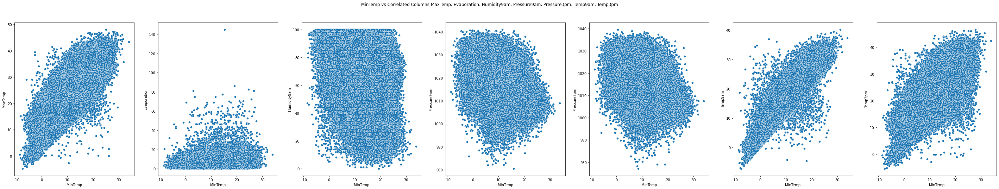

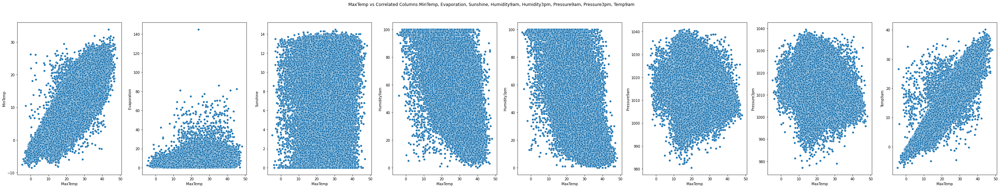

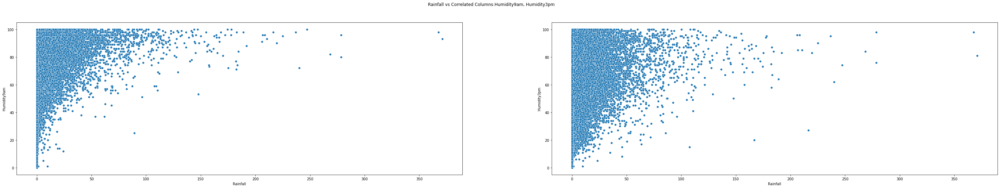

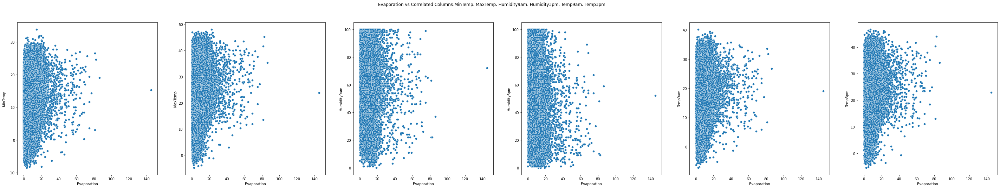

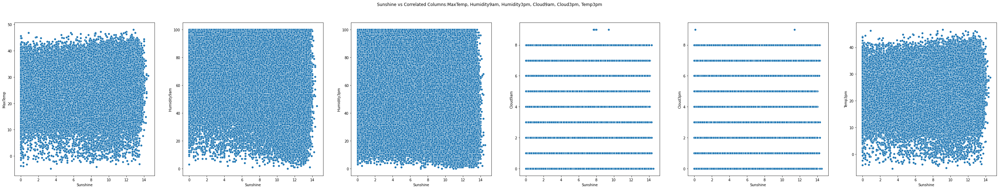

...

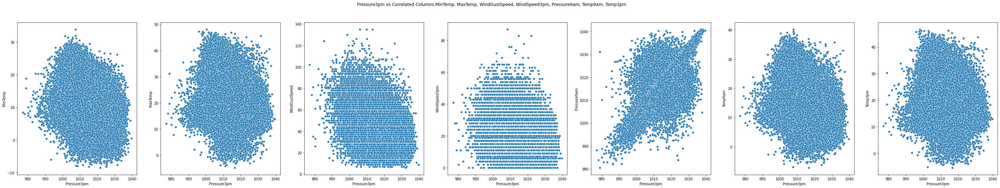

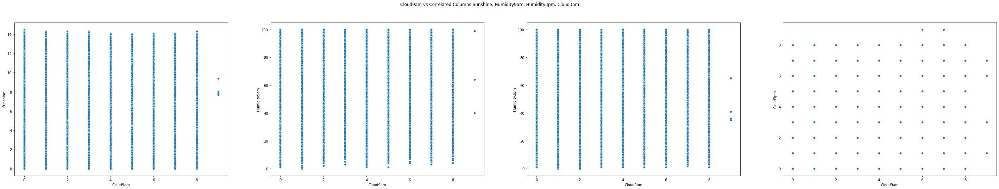

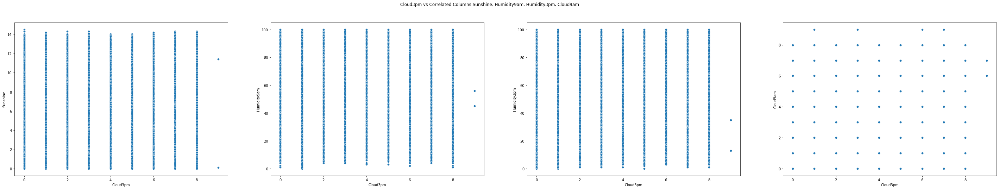

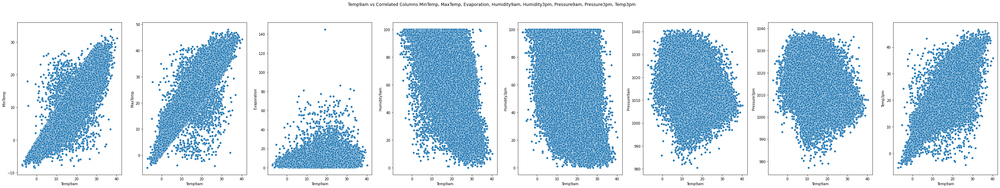

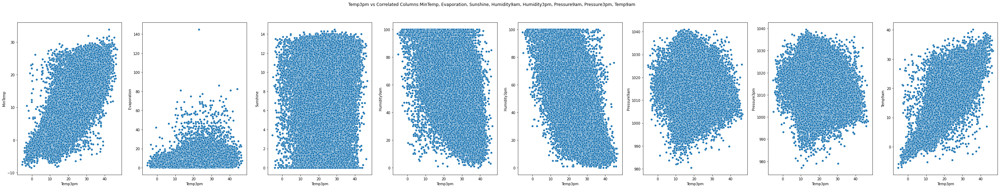

In [224]:
draw_scatter_plot_between_correlated_feature(df_imp, corr_col_arr)

In [225]:
def appy_deterministic_imp(df):
    dataset = df.copy()
    for v in corr_col_arr:
        print("Column:", v['col'])
        print("Correlated Column:",v['correlated_cols'])
        if len(v['correlated_cols']) > 0: 
            dataset = deterministic_regression_imputation(dataset, v['col'], v['correlated_cols'])
            print(dataset[v['col']].isnull().sum())
        else:
            print("No Correlated Column for", v['col'])
        print("\n")
    return dataset

In [226]:
df_det = appy_deterministic_imp(df)

Column: MinTemp
Correlated Column: ['MaxTemp', 'Evaporation', 'Humidity9am', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
0


Column: MaxTemp
Correlated Column: ['MinTemp', 'Evaporation', 'Sunshine', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am']
0


Column: Rainfall
Correlated Column: ['Humidity9am', 'Humidity3pm']
0


Column: Evaporation
Correlated Column: ['MinTemp', 'MaxTemp', 'Humidity9am', 'Humidity3pm', 'Temp9am', 'Temp3pm']
0


Column: Sunshine
Correlated Column: ['MaxTemp', 'Humidity9am', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'Temp3pm']
0


Column: WindGustSpeed
Correlated Column: ['WindSpeed9am', 'WindSpeed3pm', 'Pressure9am', 'Pressure3pm']
0


Column: WindSpeed9am
Correlated Column: ['WindGustSpeed', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am']
0


Column: WindSpeed3pm
Correlated Column: ['WindGustSpeed', 'WindSpeed9am', 'Pressure9am', 'Pressure3pm']
0


Column: Humidity9am
Correlated Column: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',

In [227]:
df_det.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

## Data Preprocessing for Categorical Columns

### Filtering Categorical Null value columns

In [228]:
categorical_null_value_cols = null_cols_df.columns[null_cols_df.dtypes == object]

In [229]:
categorical_null_value_cols

Index(['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow'], dtype='object')

In [230]:
for col in categorical_null_value_cols:
    print("Unique value of column:", col)
    print(df[col].unique())
    print("\n")

Unique value of column: WindGustDir
['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' nan 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'E' 'SSW']


Unique value of column: WindDir9am
['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' nan 'SSW' 'N' 'WSW' 'ESE' 'E'
 'NW' 'WNW' 'NNE']


Unique value of column: WindDir3pm
['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' nan 'NE']


Unique value of column: RainToday
['No' 'Yes' nan]


Unique value of column: RainTomorrow
['No' 'Yes' nan]




### Imputing Categotical value

We are using mode of a particular location to impute missing values.

In [231]:
def impute_categorical_variable(df, cat_features):
    for cat_feature in cat_features:
        print("Imputing Column:", cat_feature)
        df[cat_feature] = df[cat_feature].fillna((df.groupby('Location')[cat_feature].transform(lambda x:  next(iter(x.mode()), np.nan))))
        print(df[[cat_feature]].isnull().sum())
        print("\n")

In [232]:
impute_categorical_variable(df_det, categorical_null_value_cols)

Imputing Column: WindGustDir
WindGustDir    6079
dtype: int64


Imputing Column: WindDir9am
WindDir9am    0
dtype: int64


Imputing Column: WindDir3pm
WindDir3pm    0
dtype: int64


Imputing Column: RainToday
RainToday    0
dtype: int64


Imputing Column: RainTomorrow
RainTomorrow    0
dtype: int64




It can be seen that there are still some missing values in WindGustDir. It means some location have no value at all. We wll using mode of complete dataset.

In [233]:
df_det['WindGustDir']=df_det['WindGustDir'].fillna(df_det['WindGustDir'].mode().max())

In [234]:
df_det['WindGustDir'].isnull().sum()

0

### Encode Categorical Value

First we will encode RainToday and RainTomorrow Column. "Yes" => 1 and "No" => 0

#### Encoding Column: RainToday 

In [235]:
df_det['RainToday'] = df_det['RainToday'].apply(lambda x: 1 if x == 'Yes' else 0)

In [236]:
df_det['RainToday'].value_counts()

0    113580
1     31880
Name: RainToday, dtype: int64

#### Encoding Column: RainTomorrow

In [237]:
df_det['RainTomorrow'] = df_det['RainTomorrow'].apply(lambda x: 1 if x == 'Yes' else 0)

In [238]:
df_det['RainTomorrow'].value_counts()

0    113583
1     31877
Name: RainTomorrow, dtype: int64

### Encoding using get_dummies

In [239]:
df_det = pd.get_dummies(data=df_det, columns=['WindGustDir','WindDir9am','WindDir3pm'])

In [240]:
df_det.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
       'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am',
       'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow',
       'WindGustDir_E', 'WindGustDir_ENE', 'WindGustDir_ESE', 'WindGustDir_N',
       'WindGustDir_NE', 'WindGustDir_NNE', 'WindGustDir_NNW',
       'WindGustDir_NW', 'WindGustDir_S', 'WindGustDir_SE', 'WindGustDir_SSE',
       'WindGustDir_SSW', 'WindGustDir_SW', 'WindGustDir_W', 'WindGustDir_WNW',
       'WindGustDir_WSW', 'WindDir9am_E', 'WindDir9am_ENE', 'WindDir9am_ESE',
       'WindDir9am_N', 'WindDir9am_NE', 'WindDir9am_NNE', 'WindDir9am_NNW',
       'WindDir9am_NW', 'WindDir9am_S', 'WindDir9am_SE', 'WindDir9am_SSE',
       'WindDir9am_SSW', 'WindDir9am_SW', 'WindDir9am_W', 'WindDir9am_WNW',
       'WindDir9am_WSW', 'WindDir3pm_E', 'WindDir3pm_ENE', 'WindDir3pm_ESE',
       'WindDir3pm_N', '

In [241]:
df_det.isnull().sum()

Date              0
Location          0
MinTemp           0
MaxTemp           0
Rainfall          0
                 ..
WindDir3pm_SSW    0
WindDir3pm_SW     0
WindDir3pm_W      0
WindDir3pm_WNW    0
WindDir3pm_WSW    0
Length: 68, dtype: int64

### Scaling using Standard scaler

In [242]:

from sklearn.preprocessing import StandardScaler

def scale_dataset(df):
    dataset = df.copy()
    dataset.drop(['Date', 'Location', 'RainToday', 'RainTomorrow'], axis = 1, inplace = True)
    scaler = StandardScaler()
    return pd.DataFrame(scaler.fit_transform(dataset),columns = dataset.columns)

In [243]:
df_det_scaled = pd.merge(scale_dataset(df_det), df_det[['Date', 'Location', 'RainToday', 'RainTomorrow']],left_index=True, right_index=True )

In [244]:
df_det_scaled.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'WindGustDir_E', 'WindGustDir_ENE',
       'WindGustDir_ESE', 'WindGustDir_N', 'WindGustDir_NE', 'WindGustDir_NNE',
       'WindGustDir_NNW', 'WindGustDir_NW', 'WindGustDir_S', 'WindGustDir_SE',
       'WindGustDir_SSE', 'WindGustDir_SSW', 'WindGustDir_SW', 'WindGustDir_W',
       'WindGustDir_WNW', 'WindGustDir_WSW', 'WindDir9am_E', 'WindDir9am_ENE',
       'WindDir9am_ESE', 'WindDir9am_N', 'WindDir9am_NE', 'WindDir9am_NNE',
       'WindDir9am_NNW', 'WindDir9am_NW', 'WindDir9am_S', 'WindDir9am_SE',
       'WindDir9am_SSE', 'WindDir9am_SSW', 'WindDir9am_SW', 'WindDir9am_W',
       'WindDir9am_WNW', 'WindDir9am_WSW', 'WindDir3pm_E', 'WindDir3pm_ENE',
       'WindDir3pm_ESE', 'WindDir3pm_N', 'WindDir3pm_NE', 'WindDir3pm_NNE',
       'WindDir3pm_NNW

In [245]:
df_det_scaled.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,Date,Location,RainToday,RainTomorrow
0,0.187869,-0.045408,-0.210603,0.121720,0.125530,0.307387,0.671078,0.610793,0.112161,-1.421012,...,-0.264336,-0.246104,-0.26371,-0.277465,3.922520,-0.265584,2008-12-01,Albury,0,0
1,-0.749428,0.263737,-0.282138,0.270677,0.907841,0.307387,-1.131518,0.382224,-1.299630,-1.277304,...,-0.264336,-0.246104,-0.26371,-0.277465,-0.254938,3.765286,2008-12-02,Albury,0,0
2,0.109761,0.348049,-0.282138,0.478417,0.477428,0.456630,0.558416,0.839363,-1.613362,-1.037791,...,-0.264336,-0.246104,-0.26371,-0.277465,-0.254938,3.765286,2008-12-03,Albury,0,0
3,-0.468239,0.671246,-0.282138,0.412958,0.641172,-1.185042,-0.342882,-1.103478,-1.247342,-1.708428,...,-0.264336,-0.246104,-0.26371,-0.277465,-0.254938,-0.265584,2008-12-04,Albury,0,0
4,0.828355,1.275484,-0.162912,0.352831,-0.198250,0.083522,-0.793531,0.153654,0.687335,-0.894083,...,-0.264336,-0.246104,-0.26371,-0.277465,-0.254938,-0.265584,2008-12-05,Albury,0,0


# Exploratory Data Analysis

## Highest and Lowest MinTemp by Location

In [246]:
gp_min_temp = df_det.groupby('Location')['MinTemp'].agg(['min', 'max']).reset_index()

In [247]:
gp_min_temp.sort_values('min').head(3)

,Location,min,max
24,Newcastle,-11.069377,31.602032
18,Melbourne,-8.687461,31.771550
23,MountGinini,-8.500000,27.553852


MonutGinni has the lowest MinTemp.

In [248]:
gp_min_temp.sort_values('max', ascending=False).head(3)

,Location,min,max
41,Uluru,-1.900000,34.139895
0,Adelaide,0.700000,33.900000
16,Katherine,0.088944,32.696317


Adelaide has the highest MinTemp 

### Highest and Lowest MaxTemp by Location

In [249]:
gp_max_temp = df_det.groupby('Location')['MaxTemp'].agg(['min', 'max']).reset_index()

In [250]:
gp_max_temp.sort_values('min').head(3)

,Location,min,max
23,MountGinini,-4.800000,35.603865
34,Richmond,0.790349,47.000000
40,Tuggeranong,2.600000,41.100000


MountGinini has the lowest MaxTemp

In [251]:
gp_max_temp.sort_values('max', ascending=False).head(3)

,Location,min,max
48,Woomera,11.200000,48.1
21,Moree,9.600000,47.3
34,Richmond,0.790349,47.0


Woomera has the highest MaxTemp.

In [252]:
corr = df_det_scaled.corr().round(2)

In [253]:
corr

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday,RainTomorrow
MinTemp,1.00,0.73,0.10,0.48,0.10,0.17,0.17,0.17,-0.23,0.03,...,-0.01,0.08,0.02,-0.04,-0.05,-0.08,-0.05,-0.06,0.05,0.08
MaxTemp,0.73,1.00,-0.08,0.60,0.45,0.07,0.01,0.05,-0.49,-0.48,...,-0.06,0.03,-0.01,-0.06,-0.05,-0.08,-0.03,-0.06,-0.22,-0.16
Rainfall,0.10,-0.08,1.00,-0.06,-0.20,0.13,0.08,0.06,0.22,0.25,...,0.02,0.01,0.01,0.03,0.01,0.02,0.01,0.01,0.50,0.23
Evaporation,0.48,0.60,-0.06,1.00,0.35,0.18,0.17,0.12,-0.50,-0.39,...,-0.01,0.03,0.02,-0.01,0.00,-0.04,-0.03,-0.01,-0.18,-0.12
Sunshine,0.10,0.45,-0.20,0.35,1.00,-0.02,0.00,0.04,-0.45,-0.58,...,-0.04,0.01,-0.02,-0.02,0.02,-0.02,-0.01,0.00,-0.29,-0.38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WindDir3pm_W,-0.08,-0.08,0.02,-0.04,-0.02,0.09,0.03,0.06,0.00,-0.02,...,-0.08,-0.08,-0.07,-0.07,-0.07,1.00,-0.07,-0.07,0.05,0.02
WindDir3pm_WNW,-0.05,-0.03,0.01,-0.03,-0.01,0.09,0.02,0.05,-0.00,-0.03,...,-0.07,-0.08,-0.07,-0.06,-0.07,-0.07,1.00,-0.07,0.03,0.03
WindDir3pm_WSW,-0.06,-0.06,0.01,-0.01,0.00,0.05,0.02,0.04,-0.01,-0.02,...,-0.07,-0.08,-0.07,-0.07,-0.07,-0.07,-0.07,1.00,0.04,0.00
RainToday,0.05,-0.22,0.50,-0.18,-0.29,0.15,0.10,0.08,0.34,0.37,...,0.03,-0.00,0.01,0.05,0.04,0.05,0.03,0.04,1.00,0.31


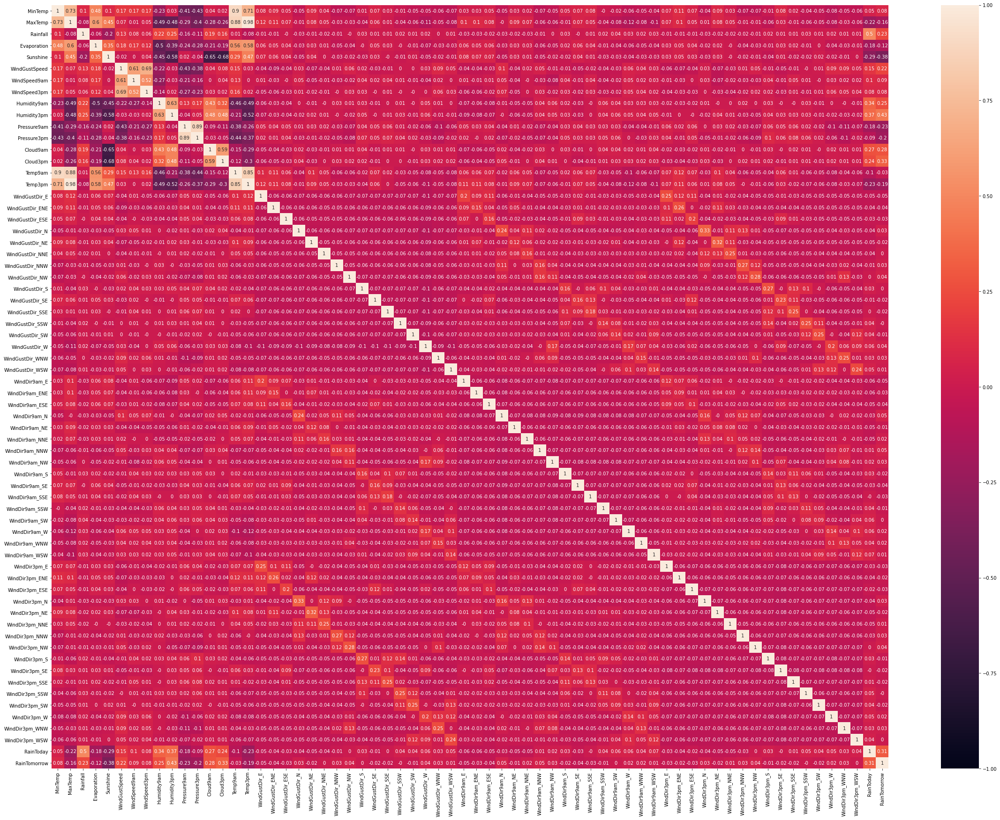

In [254]:
plt.figure(figsize=(40,30))
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=True)

- **det_Temp9am and det_Temp3pm has high correlation with det_MinTemp and det_MaxTemp. So we will drop those column. To avoid overfitting**

In [255]:
def drop_column_to_avoid_overfitting(df):
    dataset = df.copy()
    dataset.drop('Temp9am',axis=1,inplace=True)
    dataset.drop('Temp3pm',axis=1,inplace=True)
    return dataset

In [256]:
df_det_scaled_new = drop_column_to_avoid_overfitting(df_det_scaled)

#### Column with Zero Correlation

In [257]:
zreo_corr_col =  corr[corr['RainTomorrow'] == 0].index

In [258]:
zreo_corr_col

Index(['WindGustDir_NNE', 'WindGustDir_S', 'WindGustDir_SSW', 'WindDir9am_SW',
       'WindDir3pm_SSW', 'WindDir3pm_WSW'],
      dtype='object')

#### Dropping column with Zero correlation

In [259]:
df_det_scaled_new.drop(zreo_corr_col, axis = 1, inplace = True)


In [260]:
df_det_scaled_new.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'WindGustDir_E', 'WindGustDir_ENE', 'WindGustDir_ESE', 'WindGustDir_N',
       'WindGustDir_NE', 'WindGustDir_NNW', 'WindGustDir_NW', 'WindGustDir_SE',
       'WindGustDir_SSE', 'WindGustDir_SW', 'WindGustDir_W', 'WindGustDir_WNW',
       'WindGustDir_WSW', 'WindDir9am_E', 'WindDir9am_ENE', 'WindDir9am_ESE',
       'WindDir9am_N', 'WindDir9am_NE', 'WindDir9am_NNE', 'WindDir9am_NNW',
       'WindDir9am_NW', 'WindDir9am_S', 'WindDir9am_SE', 'WindDir9am_SSE',
       'WindDir9am_SSW', 'WindDir9am_W', 'WindDir9am_WNW', 'WindDir9am_WSW',
       'WindDir3pm_E', 'WindDir3pm_ENE', 'WindDir3pm_ESE', 'WindDir3pm_N',
       'WindDir3pm_NE', 'WindDir3pm_NNE', 'WindDir3pm_NNW', 'WindDir3pm_NW',
       'WindDir3pm_S', 'WindDir3pm_SE', 'WindDir3pm_SSE', 'WindDir3pm_SW',
       'WindD

In [261]:
total_dp = len(df['RainTomorrow'])
df_det_scaled_new.groupby('RainTomorrow')['RainTomorrow'].count().apply( lambda x: (x/total_dp) * 100  )

RainTomorrow
0    78.085384
1    21.914616
Name: RainTomorrow, dtype: float64

Dataset is higly imbalance. 78% contains No, and 22% contains Yes.

# Feature Selection

We will use lasso regression for feature selection.

In [262]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

In [263]:
dataset = df_det_scaled_new.copy()
dataset.drop(['Date', 'Location'], axis = 1, inplace =True)
Y_det = dataset['RainTomorrow']
X_det = dataset.drop('RainTomorrow', axis = 1)

In [264]:
feature_sel_model = SelectFromModel(Lasso(alpha=0.005, random_state = 0))
feature_sel_model.fit(X_det, Y_det)

SelectFromModel(estimator=Lasso(alpha=0.005, random_state=0))

In [265]:
feature_sel_model.get_support()

array([False, False,  True, False,  True,  True,  True,  True, False,
        True, False,  True, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False,  True,  True,  True, False, False,  True,
       False, False,  True, False, False, False, False, False, False,
        True, False,  True,  True,  True, False, False,  True, False,
       False,  True,  True])

In [266]:
selected_feat = X_det.columns[(feature_sel_model.get_support())]

In [267]:
selected_feat

Index(['Rainfall', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
       'Humidity3pm', 'Pressure3pm', 'Cloud3pm', 'WindDir9am_ENE',
       'WindDir9am_N', 'WindDir9am_NE', 'WindDir9am_NNE', 'WindDir9am_S',
       'WindDir9am_SSW', 'WindDir3pm_N', 'WindDir3pm_NNE', 'WindDir3pm_NNW',
       'WindDir3pm_NW', 'WindDir3pm_SSE', 'WindDir3pm_WNW', 'RainToday'],
      dtype='object')

# Model Selection and Cross Validation

In [268]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

In [269]:
def apply_stratified_k_fold_validation( model, x = df_det_scaled_new[selected_feat], y = Y_det ):
    stratified_acc = []
    for train_index, test_index in skf.split(x , y):
        x_train_fold, x_test_fold = x.iloc[train_index.tolist()], x.iloc[test_index.tolist()]
        y_train_fold, y_test_fold = y.iloc[train_index.tolist()], y.iloc[test_index.tolist()]
        model.fit(x_train_fold, y_train_fold)
        stratified_acc.append(model.score(x_test_fold, y_test_fold))
    
    print("\n")
    print('List of possible accuracy:', stratified_acc)
    
    print("\n")
    print('Maximum Accuracy That can be obtained from this model is:', max(stratified_acc)*100, '%')
    
    print("\n")
    print('Minimum Accuracy:', min(stratified_acc)*100, '%')
    
    print("\n")
    print('Overall Accuracy:', np.mean(stratified_acc)*100, '%')
    
    print("\n")
    print('Standard Deviation is:', np.std(stratified_acc)*100, '%')

## Logistics Regression

In [270]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
apply_stratified_k_fold_validation(model)



List of possible accuracy: [0.8432558779045786, 0.8407809707135983, 0.841880929465145, 0.839543517118108, 0.8421559191530318, 0.8404372336037399, 0.8424309088409184, 0.8443558366561253, 0.8397497593840231, 0.8462807644713323]


Maximum Accuracy That can be obtained from this model is: 84.62807644713322 %


Minimum Accuracy: 83.9543517118108 %


Overall Accuracy: 84.20871717310602 %


Standard Deviation is: 0.20156012553715305 %


## k-Nearest Neighbors

In [271]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=5)    
apply_stratified_k_fold_validation(model)



List of possible accuracy: [0.8269627388972913, 0.824487831706311, 0.8278564553829232, 0.8222879142032173, 0.8249003162381411, 0.8279939502268665, 0.8299188780420734, 0.8324625326550255, 0.8264815069434897, 0.8278564553829232]


Maximum Accuracy That can be obtained from this model is: 83.24625326550255 %


Minimum Accuracy: 82.22879142032173 %


Overall Accuracy: 82.71208579678262 %


Standard Deviation is: 0.27177500193819665 %


## Decision Trees

In [272]:
from sklearn import tree

model = tree.DecisionTreeClassifier()
apply_stratified_k_fold_validation(model)



List of possible accuracy: [0.7709335899903753, 0.7775333424996562, 0.7762958889041661, 0.7737522342912141, 0.7706586003024887, 0.7735459920252991, 0.7769146157019112, 0.7717585590540355, 0.778220816719373, 0.7782895641413446]


Maximum Accuracy That can be obtained from this model is: 77.82895641413447 %


Minimum Accuracy: 77.06586003024887 %


Overall Accuracy: 77.47903203629863 %


Standard Deviation is: 0.2864953441107917 %


## XBoost Classifier

In [275]:
from xgboost import XGBClassifier

model = XGBClassifier(max_depth=12,random_state = 42, use_label_encoder =False)
apply_stratified_k_fold_validation(model)

[20:13:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:13:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:14:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:14:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

## Naive Bayes Classifier

In [274]:
from sklearn.naive_bayes import GaussianNB

model = GaussianNB()
apply_stratified_k_fold_validation(model)



List of possible accuracy: [0.8101883679362024, 0.807300976213392, 0.8081259452770521, 0.8036573628488932, 0.8081259452770521, 0.8077822081671937, 0.8118383060635226, 0.8107383473119758, 0.8129382648150695, 0.8117008112195793]


Maximum Accuracy That can be obtained from this model is: 81.29382648150695 %


Minimum Accuracy: 80.36573628488932 %


Overall Accuracy: 80.92396535129932 %


Standard Deviation is: 0.26298562279126003 %


## **Best Models are Logistic Regression and XGBoost with Accuracy of 84%.**